In [2]:
import ee
import geemap
import json
import pandas as pd
import math
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix

ee.Authenticate()
ee.Initialize(project='ee-yuxinchen118')

In [2]:
coords = [[[7.365302030814007, 45.99791113635203],
           [7.365302030814007, 45.890003655794075],
           [7.564429228079632, 45.890003655794075],
           [7.564429228079632, 45.99791113635203],
           [7.365302030814007, 45.99791113635203]]]


geometry = ee.Geometry.Polygon(coords)
center = geometry.centroid()
center_coords = center.getInfo()['coordinates']
x_center = center_coords[0]
y_center = center_coords[1]

# 25km×20km
lat_degree = 20 / 111.32  
lon_degree = 25 / (111.32 * math.cos(math.radians(y_center)))  


Aosta_region = ee.Geometry.Rectangle([
    x_center - lon_degree / 2,
    y_center - lat_degree / 2,
    x_center + lon_degree / 2,
    y_center + lat_degree / 2
])

color_scheme = {
    'water': '#419BDF',
    'trees': '#397D49',
    'grass': '#88B053',
    'shrub': '#DFC35A',
    'bare': '#A59B8F',
    'snowice': '#B39FE1'
}

classes = [ 'water', 'trees','grass','shrub','bare','snowice']
class_values = [0, 1, 2, 3, 4,5]  
palette = [color_scheme[cls] for cls in classes]



In [3]:
image_id = "20221006T102949_20221006T103655_T32TLR"
sentinel_image = ee.Image("COPERNICUS/S2_SR/" + image_id)


# 选择关键波段
selected_bands = ['B2', 'B3', 'B4', 'B5', 'B6', 'B7', 'B8', 'B8A', 'B11', 'B12'] 
image = sentinel_image.select(selected_bands).clip(Aosta_region)

ndvi = image.normalizedDifference(['B8', 'B4']).rename('NDVI')
ndwi = image.normalizedDifference(['B3', 'B8']).rename('NDWI')
ndbi = image.normalizedDifference(['B11', 'B8']).rename('NDBI')
bsi = image.expression(
    '((B11 + B4) - (B8 + B2)) / ((B11 + B4) + (B8 + B2))', {
        'B11': image.select('B11'),
        'B4': image.select('B4'),
        'B8': image.select('B8'),
        'B2': image.select('B2')
    }
).rename('BSI')

composite = image.addBands([ndvi, ndwi, ndbi, bsi])
all_bands = selected_bands + ['NDVI', 'NDWI', 'NDBI', 'BSI']

In [4]:
# 读取训练和验证 CSV
train_df = pd.read_csv('Aosta_pixels_training_data.csv')
valid_df = pd.read_csv('Aosta_pixels_validation_data.csv')

# 提取波段名
all_bands = ['B2', 'B3', 'B4', 'B5', 'B6', 'B7',
             'B8', 'B8A', 'B11', 'B12',
             'NDVI', 'NDWI', 'NDBI', 'BSI']

# 将 pandas DataFrame 转换为 GEE FeatureCollection
def df_to_fc(df):
    features = []
    for _, row in df.iterrows():
        geom = ee.Geometry.Point(json.loads(row['.geo'])['coordinates'])
        properties = {key: row[key] for key in all_bands + ['class']}
        features.append(ee.Feature(geom, properties))
    return ee.FeatureCollection(features)

train_fc = df_to_fc(train_df)
valid_fc = df_to_fc(valid_df)

In [5]:
# 从 composite 中提取样本用于训练
train_data = composite.sampleRegions(
    collection=train_fc,
    properties=['class'],
    scale=10,
    geometries=False
)

# 训练 Random Forest 分类器
classifier = ee.Classifier.smileRandomForest(
    numberOfTrees=100,
    seed=42,
    minLeafPopulation=10,
    bagFraction=0.7
).train(
    features=train_data,
    classProperty='class',
    inputProperties=all_bands
)

# 应用分类器
classified = composite.classify(classifier)

In [ ]:
# 设置颜色方案
color_scheme = {
    'water': '#419BDF',
    'trees': '#397D49',
    'grass': '#88B053',
    'shrub': '#F0EA45',
    'bare': '#A59B8F',
    'snowice': '#B39FE1'
}
classes = ['water', 'trees', 'grass', 'shrub', 'bare', 'snowice']
palette = [color_scheme[c] for c in classes]
Map = geemap.Map(center=[45.9, 7.5], zoom=10)
Map.addLayer(classified,
             {'min': 0, 'max': 5, 'palette': palette},
             'RF Classification')
Map.add_legend(title="Land Cover Types", legend_dict=color_scheme)
Map

Map(center=[45.9, 7.5], controls=(WidgetControl(options=['position', 'transparent_bg'], widget=SearchDataGUI(c…

In [6]:
# 设置颜色方案
from pathlib import Path

def export_aosta_classification(classified):
 

    # 2. 裁剪并转换为整数类型（用于 GeoTIFF 导出）
    classified_clipped = classified.clip(Aosta_region).byte()

    # 3. 创建导出任务
    task = ee.batch.Export.image.toDrive(
        image=classified_clipped,           # ✅ 原始分类图（非可视化）
        description='aosta_rf_classification',
        folder='Mapresult',       # Drive 文件夹名
        fileNamePrefix='Aosta_RF_Classification',  # 文件名前缀
        region=Aosta_region,
        scale=30,
        crs='EPSG:4326',
        fileFormat='GeoTIFF',
        maxPixels=1e9
    )

    # 4. 启动任务
    task.start()
    print("✅ 导出任务已启动！请稍候检查 Google Drive 中的 EarthEngine_Exports 文件夹。")
    return task

# ✅ 调用函数
export_task = export_aosta_classification(classified)

✅ 导出任务已启动！请稍候检查 Google Drive 中的 EarthEngine_Exports 文件夹。


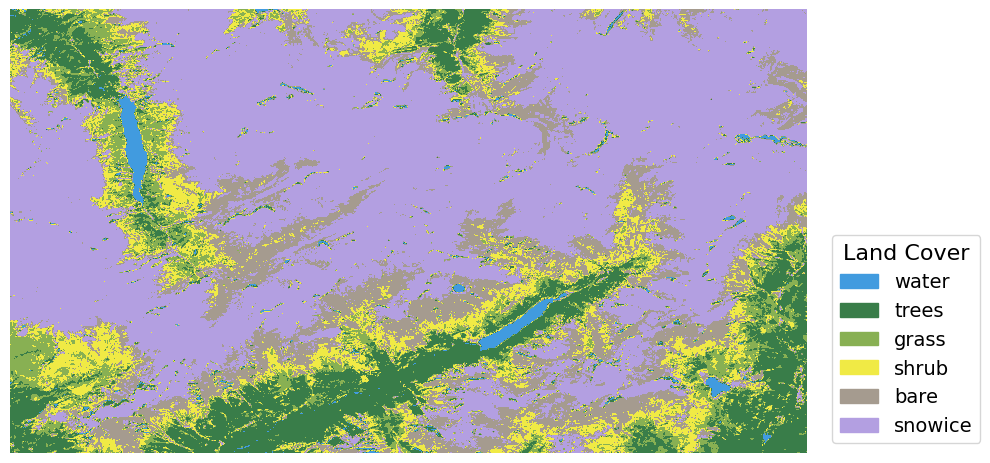

In [7]:

import rasterio
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import numpy as np

# 类别颜色定义
color_scheme = {
    'water': '#419BDF',
    'trees': '#397D49',
    'grass': '#88B053',
    'shrub': '#F0EA45',
    'bare': '#A59B8F',
    'snowice': '#B39FE1'
}
palette = list(color_scheme.values())
classes = list(color_scheme.keys())

# 读取 RF 分类 tif
with rasterio.open('Aosta_RF_Classification.tif') as src:
    rf_image = src.read(1)

# 绘图
plt.figure(figsize=(10, 10))
cmap = plt.matplotlib.colors.ListedColormap(palette)
plt.imshow(rf_image, cmap=cmap, vmin=0, vmax=5)
plt.axis('off')

# 图例右下角外部
legend_patches = [Patch(color=palette[i], label=classes[i]) for i in range(len(classes))]
plt.legend(
    handles=legend_patches,
    title="Land Cover",
    loc='lower left',
    bbox_to_anchor=(1.02, 0),
    frameon=True,
    fontsize=14,
    title_fontsize=16
)

plt.tight_layout()
plt.savefig("Aosta_RF_Classification_with_Legend.png", dpi=300, bbox_inches='tight')
plt.show()

Validation Accuracy: 0.9769014084507043
Confusion Matrix:
[[287   0   0   0   0   0]
 [  0 296   2   0   0   0]
 [  0   0 298   8   0   0]
 [  0   0  16 269   4   0]
 [  0   0   0   8 288   0]
 [  0   0   0   0   3 296]]


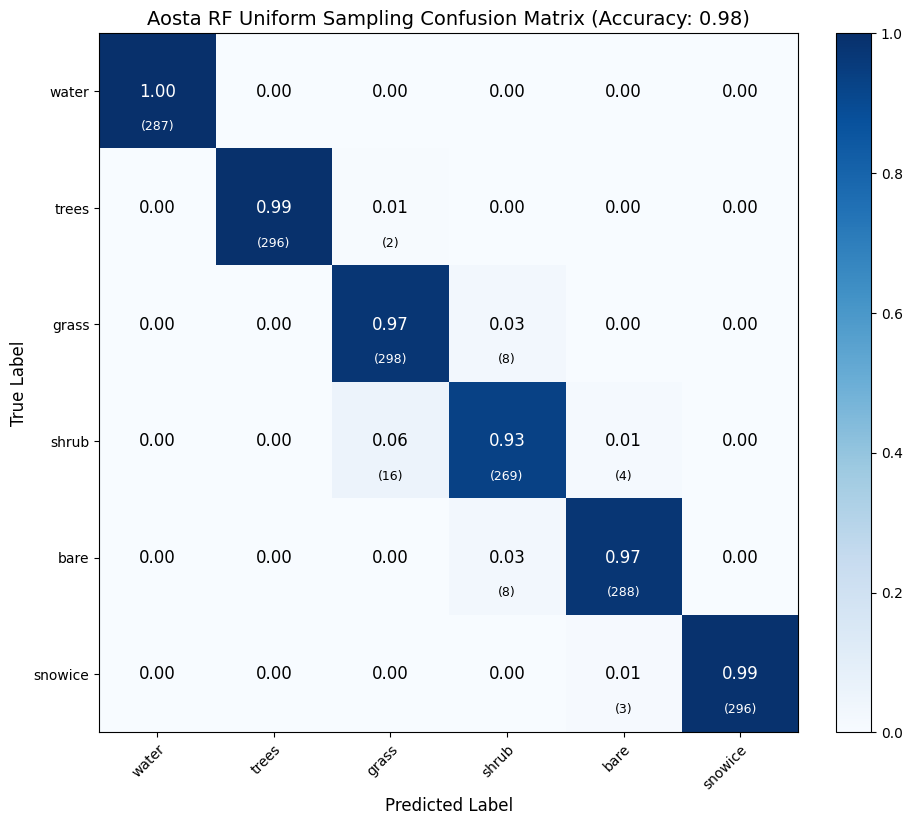

In [8]:
# 从 composite 中提取样本用于验证（注意 geometries=False）
val_data = composite.sampleRegions(
    collection=valid_fc,
    properties=['class'],
    scale=10,
    geometries=False
)

# 用训练好的分类器对验证集进行分类
validated = val_data.classify(classifier)

# 计算混淆矩阵
confusion_matrix = validated.errorMatrix('class', 'classification')

# 输出准确率
print('Validation Accuracy:', confusion_matrix.accuracy().getInfo())
print('Confusion Matrix:')
print(np.array(confusion_matrix.array().getInfo()))

# 可视化混淆矩阵（你的函数）
def plot_ee_confusion_matrix(confusion_matrix, class_names=None):
    cm_array = np.array(confusion_matrix.array().getInfo())
    accuracy = confusion_matrix.accuracy().getInfo()
    if class_names is None:
        n_classes = cm_array.shape[0]
        class_names = [str(i) for i in range(n_classes)]
    cm_normalized = np.zeros(cm_array.shape)
    for i in range(cm_array.shape[0]):
        row_sum = np.sum(cm_array[i, :])
        if row_sum > 0:
            cm_normalized[i, :] = cm_array[i, :] / row_sum
    
    fig, ax = plt.subplots(figsize=(10, 8))

    im = ax.imshow(cm_normalized, interpolation='nearest', cmap='Blues', vmin=0, vmax=1)
    
    ax.set_title(f'Aosta RF Uniform Sampling Confusion Matrix (Accuracy: {accuracy:.2f})', fontsize=14)
    ax.set_ylabel('True Label', fontsize=12)
    ax.set_xlabel('Predicted Label', fontsize=12)
   
    ax.set_xticks(np.arange(len(class_names)))
    ax.set_yticks(np.arange(len(class_names)))
    ax.set_xticklabels(class_names)
    ax.set_yticklabels(class_names)
    
    for i in range(len(class_names)):
        for j in range(len(class_names)):
            ax.text(j, i, f"{cm_normalized[i, j]:.2f}",
                    ha="center", va="center",
                    color="white" if cm_normalized[i, j] > 0.5 else "black",
                    fontsize=12)
            if cm_array[i, j] > 0:
                ax.text(j, i + 0.3, f"({int(cm_array[i, j])})",
                        ha="center", va="center",
                        color="white" if cm_normalized[i, j] > 0.5 else "black",
                        fontsize=9)
    
    cbar = ax.figure.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
    fig.tight_layout()
    plt.setp(ax.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")
    
    return fig, ax

# 设置类别名称
class_names = ['water', 'trees', 'grass', 'shrub', 'bare', 'snowice']

# 调用绘图
fig, ax = plot_ee_confusion_matrix(confusion_matrix, class_names)
plt.show()

In [35]:
def compute_accuracies(conf_matrix):
    cm = np.array(conf_matrix.array().getInfo())
    
    # 总样本数
    total = cm.sum()
    
    # 真实类总数（按行）
    actual = cm.sum(axis=1)
    
    # 预测类总数（按列）
    predicted = cm.sum(axis=0)
    
    # 准确分类数（对角线）
    correct = np.diag(cm)
    
    # Producer's Accuracy = 正确分类数 / 实际该类总数
    PA = correct / actual

    # User's Accuracy = 正确分类数 / 被预测为该类总数
    UA = correct / predicted

    # Overall Accuracy
    OA = correct.sum() / total
    
    # Kappa Coefficient
    expected = np.dot(actual, predicted) / (total ** 2)
    kappa = (OA - expected) / (1 - expected)

    return PA, UA, OA, kappa

# 计算 PA, UA, OA, Kappa
PA, UA, OA, kappa = compute_accuracies(confusion_matrix)

# 打印结果
print("📊 Accuracy Report")
print("Class\t\tPA\t\tUA")
for i, class_name in enumerate(class_names):
    print(f"{class_name:<10}\t{PA[i]:.4f}\t\t{UA[i]:.4f}")

print(f"\n✅ Overall Accuracy: {OA:.4f}")
print(f"✅ Kappa Coefficient: {kappa:.4f}")

📊 Accuracy Report
Class		PA		UA
water     	1.0000		1.0000
trees     	0.9933		1.0000
grass     	0.9739		0.9430
shrub     	0.9308		0.9439
bare      	0.9730		0.9763
snowice   	0.9900		1.0000

✅ Overall Accuracy: 0.9769
✅ Kappa Coefficient: 0.9723


In [3]:
coords = [[[7.365302030814007, 45.99791113635203],
           [7.365302030814007, 45.890003655794075],
           [7.564429228079632, 45.890003655794075],
           [7.564429228079632, 45.99791113635203],
           [7.365302030814007, 45.99791113635203]]]


geometry = ee.Geometry.Polygon(coords)
center = geometry.centroid()
center_coords = center.getInfo()['coordinates']
x_center = center_coords[0]
y_center = center_coords[1]

# 25km×20km
lat_degree = 20 / 111.32  
lon_degree = 25 / (111.32 * math.cos(math.radians(y_center)))  


aosta_region = ee.Geometry.Rectangle([
    x_center - lon_degree / 2,
    y_center - lat_degree / 2,
    x_center + lon_degree / 2,
    y_center + lat_degree / 2
])

# ========== 加载 Sentinel-2 SR 图像并选择 RGB 波段 ==========
image_id = "20221006T102949_20221006T103655_T32TLR"
sentinel_image = ee.Image("COPERNICUS/S2_SR/" + image_id).clip(aosta_region)

rgb_image = sentinel_image.select(['B4', 'B3', 'B2'])  # 红绿蓝

# ========== 下载到本地 ==========
geemap.download_ee_image(
    image=rgb_image,
    filename='aosta_sentinel2_rgb.tif',
    region=aosta_region,
    scale=10,
    crs='EPSG:4326'
)

print("✅ Sentinel-2 RGB 图像已成功下载为 'aosta_sentinel2_rgb.tif'")

aosta_sentinel2_rgb.tif: |          | 0.00/43.2M (raw) [  0.0%] in 00:00 (eta:     ?)

✅ Sentinel-2 RGB 图像已成功下载为 'aosta_sentinel2_rgb.tif'


ERROR 1: _TIFFVSetField:/vsimem/decompress_0x101bab050.tif: Bad value 2 for "ExtraSamples" tag
ERROR 1: _TIFFVSetField:/vsimem/decompress_0x101bab000.tif: Bad value 2 for "ExtraSamples" tag
ERROR 1: _TIFFVSetField:/vsimem/decompress_0x101bab028.tif: Bad value 2 for "ExtraSamples" tag
ERROR 1: _TIFFVSetField:/vsimem/decompress_0x101bab0c8.tif: Bad value 2 for "ExtraSamples" tag
ERROR 1: _TIFFVSetField:/vsimem/decompress_0x101bab0a0.tif: Bad value 2 for "ExtraSamples" tag
ERROR 1: _TIFFVSetField:/vsimem/decompress_0x101bab078.tif: Bad value 2 for "ExtraSamples" tag
ERROR 1: _TIFFVSetField:/vsimem/decompress_0x101bab0f0.tif: Bad value 2 for "ExtraSamples" tag
ERROR 1: _TIFFVSetField:/vsimem/decompress_0x101bab910.tif: Bad value 2 for "ExtraSamples" tag
ERROR 1: _TIFFVSetField:/vsimem/decompress_0x101bab938.tif: Bad value 2 for "ExtraSamples" tag
ERROR 1: _TIFFVSetField:/vsimem/decompress_0x101bab8e8.tif: Bad value 2 for "ExtraSamples" tag
ERROR 1: _TIFFVSetField:/vsimem/decompress_0x101ba

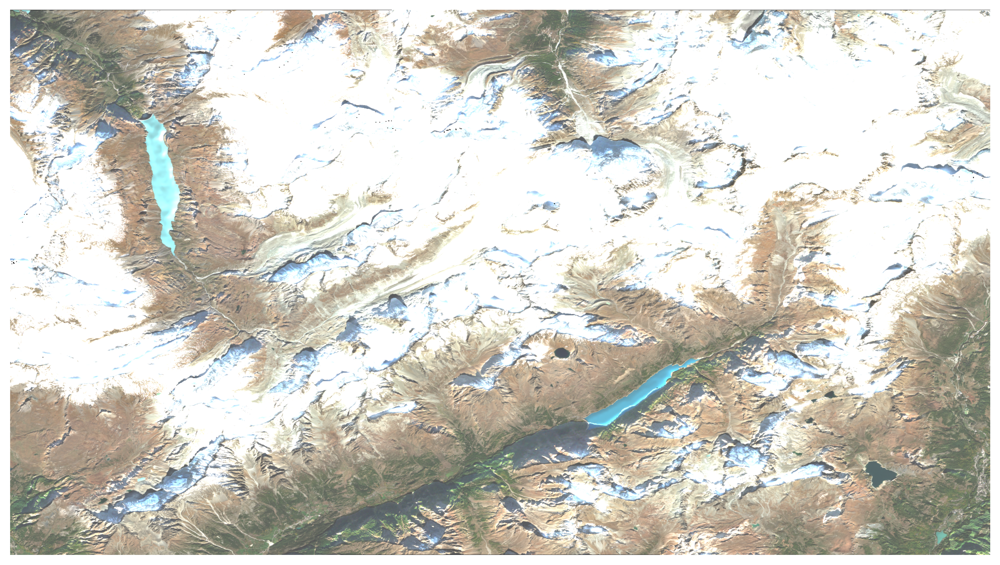

In [4]:
import rasterio
import matplotlib.pyplot as plt
import numpy as np

# 打开图像
with rasterio.open('aosta_sentinel2_rgb.tif') as src:
    img = src.read()  # 3 × H × W
    bounds = src.bounds

    # 获取图像实际长宽比（以 km 为单位）
    lat_range = bounds.top - bounds.bottom
    lon_range = bounds.right - bounds.left
    avg_lat = (bounds.top + bounds.bottom) / 2

    # 转换为公里
    km_per_deg_lat = 111.32
    km_per_deg_lon = 111.32 * math.cos(math.radians(avg_lat))
    lat_km = lat_range * km_per_deg_lat
    lon_km = lon_range * km_per_deg_lon
    aspect_ratio = lon_km / lat_km

# 设置显示大小
height_inches = 8
width_inches = height_inches * aspect_ratio

# 转置为 H × W × 3 并缩放到 0–1 范围（Sentinel-2 原始反射率 × 10000）
img = np.transpose(img, (1, 2, 0))  # H × W × 3
img = np.clip(img / 3000, 0, 1)     # 简单拉伸映射至 0–1（可视化效果较好）

# 绘图
plt.figure(figsize=(width_inches, height_inches), dpi=300)
plt.imshow(img, extent=[bounds.left, bounds.right, bounds.bottom, bounds.top])
plt.axis('off')
plt.tight_layout()
plt.savefig("Aosta_Sentinel2_RGB.png", dpi=300, bbox_inches='tight')
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..5.872].


⚠️ Skipped a row due to error: list index out of range
⚠️ Skipped a row due to error: list index out of range
⚠️ Skipped a row due to error: list index out of range
⚠️ Skipped a row due to error: list index out of range
⚠️ Skipped a row due to error: list index out of range
⚠️ Skipped a row due to error: list index out of range
⚠️ Skipped a row due to error: list index out of range
⚠️ Skipped a row due to error: list index out of range
⚠️ Skipped a row due to error: list index out of range
⚠️ Skipped a row due to error: list index out of range
⚠️ Skipped a row due to error: list index out of range
⚠️ Skipped a row due to error: list index out of range
⚠️ Skipped a row due to error: list index out of range
⚠️ Skipped a row due to error: list index out of range
⚠️ Skipped a row due to error: list index out of range
⚠️ Skipped a row due to error: list index out of range
⚠️ Skipped a row due to error: list index out of range
⚠️ Skipped a row due to error: list index out of range
⚠️ Skipped

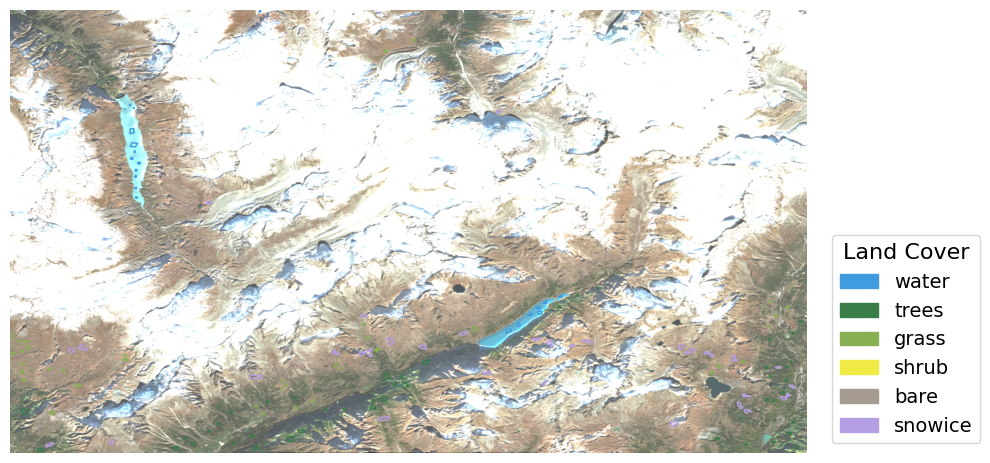

In [ ]:
import rasterio
import matplotlib.pyplot as plt
from matplotlib.patches import Patch, Polygon as MplPolygon
import pandas as pd
import json
import numpy as np

# ========== 类别颜色定义 ==========
color_scheme = {    'water': '#419BDF',
    'trees': '#397D49',
    'grass': '#88B053',
    'shrub': '#F0EA45',
    'bare': '#A59B8F',
    'snowice': '#B39FE1'
   
}
# 为图例准备
classes = list(color_scheme.keys())
palette = list(color_scheme.values())
label_to_color = {label: color for label, color in zip(classes, palette)}

# ========== 读取 Sentinel-2 RGB 图像 ==========
with rasterio.open('Aosta_Sentinel2_rgb.tif') as src:
    rgb = src.read([1, 2, 3])  # R, G, B bands
    bounds = src.bounds

# 转换为 H x W x 3 并归一化
rgb = np.transpose(rgb, (1, 2, 0)) / 3000.0

# ========== 加载包含 Polygon 的训练样本 ==========
df = pd.read_csv('Aosta_Feature_Collection.csv')

# ========== 绘图 ==========
fig, ax = plt.subplots(figsize=(10, 10))

# 背景图像
ax.imshow(rgb, extent=[bounds.left, bounds.right, bounds.bottom, bounds.top])
ax.axis('off')


# ========== 外置图例（右下角）==========
legend_patches = [Patch(color=palette[i], label=classes[i]) for i in range(len(classes))]
plt.legend(
    handles=legend_patches,
    title="Land Cover",
    loc='lower left',
    bbox_to_anchor=(1.02, 0),
    frameon=True,
    fontsize=14,
    title_fontsize=16
)

# 保存与展示
plt.tight_layout()
plt.savefig("Aosta_RGB_with_TrainingPolygons_Legend.png", dpi=300, bbox_inches='tight')
plt.show()